In [36]:
import numpy as np
from matplotlib import pyplot as plt
from astropy import units as u
from astropy import constants as c
from scipy.integrate import quad, dblquad
from scipy.interpolate import CubicSpline, RectBivariateSpline
from scipy.optimize import curve_fit, fsolve
from tqdm import tqdm

In [37]:
import ROOT as r
import warnings
warnings.filterwarnings('ignore')

In [38]:
r.gSystem.Load('$EVNDISPSYS/lib/libVAnaSum.so')

1

In [39]:
def get_distance(x1, y1, x2, y2):
    square = (x2-x1) ** 2 + (y2-y1) ** 2
    return np.sqrt(square)

In [40]:
def get_impact_factor(xi):

    rel_intensity_per_az = lambda phi, xi: np.sqrt(1 - xi**2 * np.sin(phi)**2)

    if xi > 1:
        bound = np.arcsin(1/xi)
    else:
        bound = np.pi/2
    
    integ = quad(rel_intensity_per_az, 0, bound, args=(xi))[0]
    return integ * 2 / np.pi

In [41]:
test_xis = np.linspace(0, 50, 10000)
test_factors = np.zeros_like(test_xis)

for i, xi in enumerate(test_xis):
    test_factors[i] = get_impact_factor(xi)

xi_from_factor = CubicSpline(test_factors[::-1], test_xis[::-1])
xi_from_xi_div_factor = CubicSpline(test_xis / test_factors, test_xis)

In [42]:
# These don't work well on an array -- use the interpolation method (within range)

def solve_factor(y):

    f = lambda xi, factor: get_impact_factor(xi) - factor
    return fsolve(f, x0=1, args=(y))[0]

def solve_xi_div_factor(y):

    f = lambda xi, xi_div_factor: xi / get_impact_factor(xi) - xi_div_factor
    return fsolve(f, x0=1, args=(y))[0]

In [43]:
# 851000 has 100,000 muons per wobble
wobbles = ('0', '0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.9', '1', '1.1', '1.2', '1.3', '1.4')

In [44]:
# valid_sim_muon_params_per_wobble = []

# for w in tqdm(wobbles):

#     filename = '/raid/reedbuck/lrizk/veritas/simulations/evndisp/muons/851000_w' + w + '.root'
#     sim = r.TFile(filename)
#     params = sim.Get('Tel_2/tpars')

#     num_events = 0
#     for event in params:
#         if event.muonValid and event.muonRadius:
#             num_events += 1

#     sim_muon_params = np.zeros((8, num_events))
#     i = 0

#     for event in params:
#         if event.muonValid and event.muonRadius:
#             sim_muon_params[0][i] = event.muonX0
#             sim_muon_params[1][i] = event.muonY0
#             sim_muon_params[2][i] = event.muonXC
#             sim_muon_params[3][i] = event.muonYC
#             sim_muon_params[4][i] = event.muonRadius
#             sim_muon_params[5][i] = event.muonRSigma
#             sim_muon_params[6][i] = event.muonSize
#             sim_muon_params[7][i] = event.muonIPCorrectedSize
#             i += 1

#     valid_sim_muon_params_per_wobble.append(sim_muon_params)

In [45]:
sim_muon_params_per_wobble = []

for w in tqdm(wobbles):
    
    filename_mu = '/raid/reedbuck/lrizk/veritas/simulations/evndisp/muons/851000_w' + w + '.root'
    sim_mu = r.TFile(filename_mu)
    params_mu = sim_mu.Get('Tel_2/tpars')
    
    filename_mm = '/raid/reedbuck/lrizk/veritas/simulations/evndisp/muons/850000_w' + w + '.root'
    sim_mm = r.TFile(filename_mm)
    params_mm = sim_mm.Get('Tel_2/tpars')

    num_events = 0
    for event in params_mu:
        if event.muonRadius:
            num_events += 1
    for event in params_mm:
        if event.muonRadius:
            num_events += 1

    sim_muon_params = np.zeros((9, num_events))
    i = 0

    for event in params_mu:
        if event.muonRadius:
            sim_muon_params[0][i] = event.muonX0
            sim_muon_params[1][i] = event.muonY0
            sim_muon_params[2][i] = event.muonXC
            sim_muon_params[3][i] = event.muonYC
            sim_muon_params[4][i] = event.muonRadius
            sim_muon_params[5][i] = event.muonRSigma
            sim_muon_params[6][i] = event.muonSize
            sim_muon_params[7][i] = event.muonIPCorrectedSize
            sim_muon_params[8][i] = event.muonValid
            i += 1
            
    for event in params_mm:
        if event.muonRadius:
            sim_muon_params[0][i] = event.muonX0
            sim_muon_params[1][i] = event.muonY0
            sim_muon_params[2][i] = event.muonXC
            sim_muon_params[3][i] = event.muonYC
            sim_muon_params[4][i] = event.muonRadius
            sim_muon_params[5][i] = event.muonRSigma
            sim_muon_params[6][i] = event.muonSize
            sim_muon_params[7][i] = event.muonIPCorrectedSize
            sim_muon_params[8][i] = event.muonValid
            i += 1

    sim_muon_params_per_wobble.append(sim_muon_params)

100%|██████████| 15/15 [02:11<00:00,  8.75s/it]


In [46]:
# for i, w in enumerate(wobbles):
#     output = 'sim_data/muons_851000_w' + w + '.csv'
#     np.savetxt(output, sim_muon_params_per_wobble[i].T, delimiter=',')

In [47]:
# sims = 'sim_data/muons_851000_w0.csv'
# muon_x, muon_y, muon_xc, muon_yc, muon_radii, muon_radii_err, muon_sizes, muon_corr_sizes = np.loadtxt(sims, delimiter=',', unpack=True)

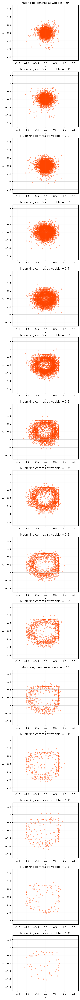

In [48]:
plt.figure(figsize=(5, 75))

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    positions = sim_muon_params_per_wobble[i][:2]

    plt.subplot(15, 1, i+1)

    plt.scatter(positions[0][validity], positions[1][validity], c='orangered', marker='o', s=10, alpha=0.4)

    plt.xlim(-1.75, 1.75)
    plt.ylim(-1.75, 1.75)

    plt.grid(alpha=0.4)
    plt.xlabel(r'$x$')
    plt.ylabel(r'$y$')
    plt.title('Muon ring centres at wobble = ' + w + '°')

plt.show()

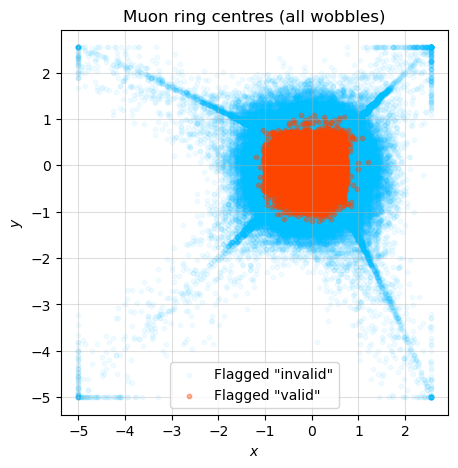

In [49]:
plt.figure(figsize=(5, 5))

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    positions = sim_muon_params_per_wobble[i][:2]

    if i == 0:
        plt.scatter(positions[0][~validity], positions[1][~validity], c='deepskyblue', marker='o', s=10, alpha=0.05, label='Flagged "invalid"')
    else:
        plt.scatter(positions[0][~validity], positions[1][~validity], c='deepskyblue', marker='o', s=10, alpha=0.05)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    positions = sim_muon_params_per_wobble[i][:2]

    if i == 0:
        plt.scatter(positions[0][validity], positions[1][validity], c='orangered', marker='o', s=10, alpha=0.4, label='Flagged "valid"')
    else:
        plt.scatter(positions[0][validity], positions[1][validity], c='orangered', marker='o', s=10, alpha=0.4)


plt.grid(alpha=0.4)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title('Muon ring centres (all wobbles)')
plt.legend()

plt.show()

In [50]:
sim_muons_w0_params = sim_muon_params_per_wobble[0]

In [51]:
distances = get_distance(*sim_muons_w0_params[:4])
radii = sim_muons_w0_params[4]
radii_err = sim_muons_w0_params[5]
corr_sizes = sim_muons_w0_params[7]
evndisp_factors = sim_muons_w0_params[6] / corr_sizes
evndisp_xis = xi_from_factor(evndisp_factors)
validity = np.array([bool(v) for v in sim_muons_w0_params[8]])

In [52]:
recalc_xis = xi_from_xi_div_factor(2 * distances / radii)
recalc_factors = np.zeros_like(recalc_xis)

for i, xi in enumerate(recalc_xis):
    recalc_factors[i] = get_impact_factor(xi)

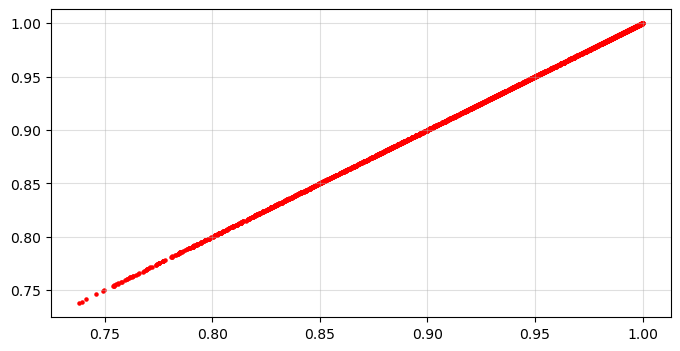

In [53]:
plt.figure(figsize=(8, 4))

plt.scatter(evndisp_factors, recalc_factors, c='red', marker='o', s=5)

plt.grid(alpha=0.4)
plt.show()

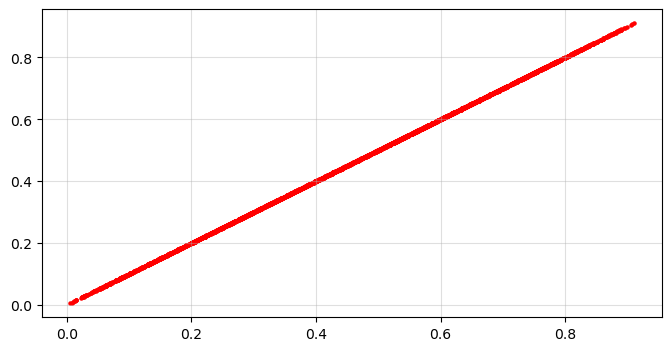

In [54]:
plt.figure(figsize=(8, 4))

plt.scatter(evndisp_xis, recalc_xis, c='red', marker='o', s=5)

plt.grid(alpha=0.4)
plt.show()

In [55]:
np.max(evndisp_xis), np.max(recalc_xis)

(nan, 2.4644136354311805)

In [56]:
for params in sim_muon_params_per_wobble:
    print(np.mean(params[6]))

303.942463582299
305.4179861273706
290.51262449489445
299.45388209167857
266.51460462111294
219.2151945603121
135.11984294307655
95.98216243569199
67.80295724112713
47.12538898493455
29.109936971972644
17.897734143321912
10.500540407003674
6.902299610123571
3.7535625065972344


In [57]:
print("num_valid, num_total")
for params in sim_muon_params_per_wobble:
    validity = np.array([bool(v) for v in params[8]])
    print(len(params[1][validity]), len(params[1]))

num_valid, num_total
4043 59861
4047 59794
4031 59641
3982 59665
3703 58817
3030 55619
2243 51701
1578 47428
1133 43757
789 40490
489 37285
302 34733
180 32383
115 30266
56 28421


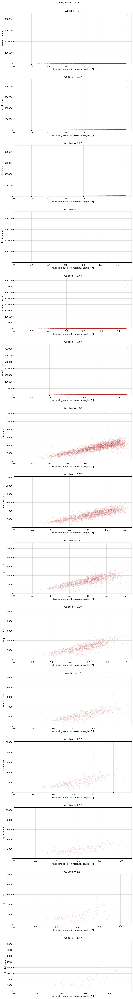

In [58]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]
    
    plt.subplot(15, 1, i+1)
    plt.scatter(radii, corr_sizes, c='firebrick', marker='o', s=10, alpha=0.1)

    plt.grid(alpha=0.4)
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel('Digital counts')
    plt.title('Wobble = ' + w + '°')

    plt.xlim(xmin=0)
    plt.ylim(ymin=0)

plt.suptitle('Ring radius vs. size')
plt.show()

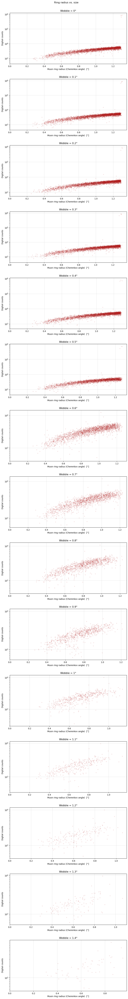

In [59]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]
    
    plt.subplot(15, 1, i+1)
    plt.scatter(radii, corr_sizes, c='firebrick', marker='o', s=10, alpha=0.1)

    plt.grid(alpha=0.4)
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel('Digital counts')
    plt.title('Wobble = ' + w + '°')

    plt.xlim(xmin=0)
    plt.yscale('log')

plt.suptitle('Ring radius vs. size')
plt.show()

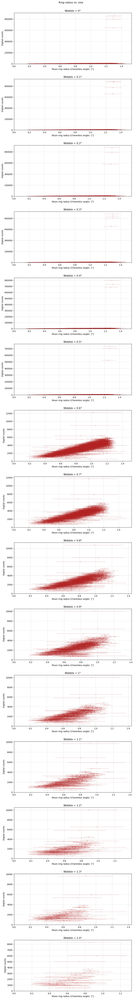

In [60]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]
    
    plt.subplot(15, 1, i+1)
    plt.errorbar(x=radii, xerr=radii_err, y=corr_sizes, c='firebrick', marker='o', ms=3, ls='', alpha=0.2)

    plt.grid(alpha=0.4)
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel('Digital counts')
    plt.title('Wobble = ' + w + '°')

    plt.xlim(xmin=0)
    plt.ylim(ymin=0)

plt.suptitle('Ring radius vs. size')
plt.show()

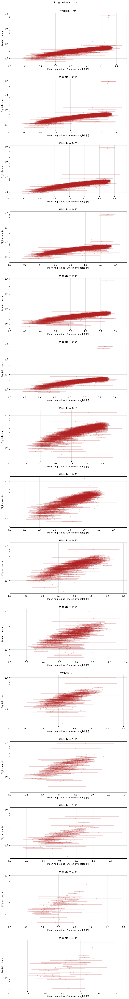

In [61]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]
    
    plt.subplot(15, 1, i+1)
    plt.errorbar(x=radii, xerr=radii_err, y=corr_sizes, c='firebrick', marker='o', ms=3, ls='', alpha=0.2)

    plt.grid(alpha=0.4)
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel('Digital counts')
    plt.title('Wobble = ' + w + '°')

    plt.xlim(xmin=0)
    plt.yscale('log')

plt.suptitle('Ring radius vs. size')
plt.show()

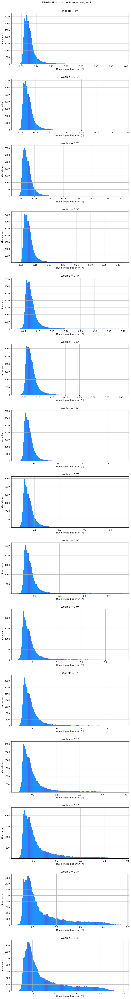

In [62]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    #validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii_err = sim_muon_params_per_wobble[i][5]#[validity]
    
    plt.subplot(15, 1, i+1)
    hist_data = plt.hist(radii_err, bins=100, edgecolor='royalblue', color='dodgerblue')

    plt.grid(alpha=0.8)
    plt.xlabel('Muon ring radius error  [°]')
    plt.ylabel('Abundance')
    plt.title('Wobble = ' + w + '°')
    
plt.suptitle('Distribution of errors in muon ring radius')
plt.show()

In [63]:
err_cutoff = 0.12

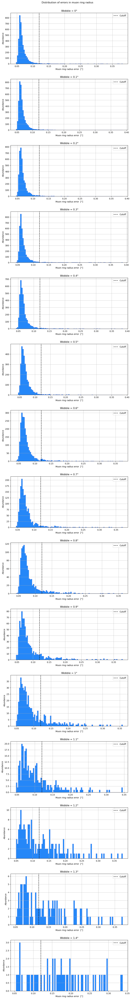

In [64]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    
    plt.subplot(15, 1, i+1)
    hist_data = plt.hist(radii_err, bins=100, edgecolor='royalblue', color='dodgerblue')
    plt.axvline(x=err_cutoff, c='black', ls='--', label='Cutoff')

    plt.grid(alpha=0.8)
    plt.xlabel('Muon ring radius error  [°]')
    plt.ylabel('Abundance')
    plt.title('Wobble = ' + w + '°')
    plt.legend()
    
plt.suptitle('Distribution of errors in muon ring radius')
plt.show()

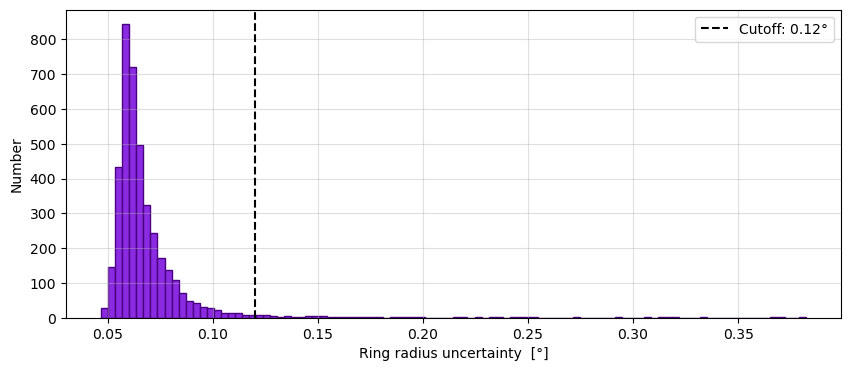

In [65]:
plt.figure(figsize=(10, 4))
#plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles[:1]):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    
    #plt.subplot(15, 1, i+1)
    hist_data = plt.hist(radii_err, bins=100, edgecolor='indigo', color='blueviolet')
    plt.axvline(x=err_cutoff, c='black', ls='--', label='Cutoff: 0.12°')

    plt.grid(alpha=0.4)
    plt.xlabel('Ring radius uncertainty  [°]')
    plt.ylabel('Number')
#    plt.title('Wobble = ' + w + '°')
    plt.legend()
    
#plt.suptitle('Distribution of errors in muon ring radius')
plt.show()

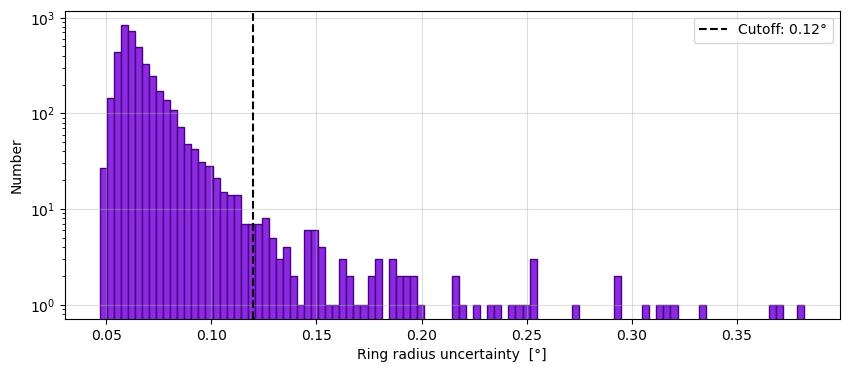

In [66]:
plt.figure(figsize=(10, 4))
#plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles[:1]):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    
    #plt.subplot(15, 1, i+1)
    hist_data = plt.hist(radii_err, bins=100, edgecolor='indigo', color='blueviolet')
    plt.axvline(x=err_cutoff, c='black', ls='--', label='Cutoff: 0.12°')

    plt.grid('both', alpha=0.4)
    plt.yscale('log')
    plt.xlabel('Ring radius uncertainty  [°]')
    plt.ylabel('Number')
#    plt.title('Wobble = ' + w + '°')
    plt.legend()
    
#plt.suptitle('Distribution of errors in muon ring radius')
plt.show()

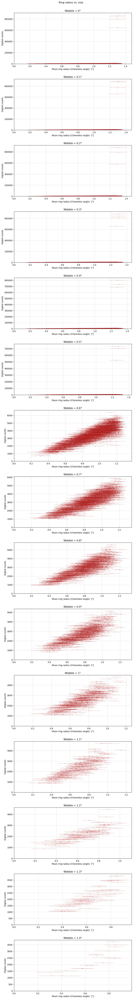

In [67]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]

    good_radii = radii[radii_err < err_cutoff]
    good_radii_err = radii_err[radii_err < err_cutoff]
    good_corr_sizes = corr_sizes[radii_err < err_cutoff]
    
    plt.subplot(15, 1, i+1)
    plt.errorbar(x=good_radii, xerr=good_radii_err, y=good_corr_sizes, c='firebrick', marker='o', ms=3, ls='', alpha=0.2)

    plt.grid(alpha=0.4)
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel('Digital counts')
    plt.title('Wobble = ' + w + '°')

    plt.xlim(xmin=0)
    plt.ylim(ymin=0)

plt.suptitle('Ring radius vs. size')
plt.show()

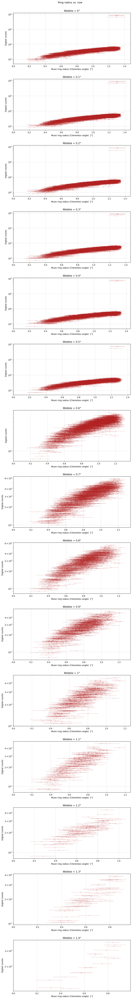

In [68]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]

    good_radii = radii[radii_err < err_cutoff]
    good_radii_err = radii_err[radii_err < err_cutoff]
    good_corr_sizes = corr_sizes[radii_err < err_cutoff]
    
    plt.subplot(15, 1, i+1)
    plt.errorbar(x=good_radii, xerr=good_radii_err, y=good_corr_sizes, c='firebrick', marker='o', ms=3, ls='', alpha=0.2)

    plt.grid(alpha=0.4)
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel('Digital counts')
    plt.title('Wobble = ' + w + '°')

    plt.xlim(xmin=0)
    plt.yscale('log')

plt.suptitle('Ring radius vs. size')
plt.show()

In [69]:
def linear_0(y, a):

    a_prime = 1/a
    
    return a_prime * y

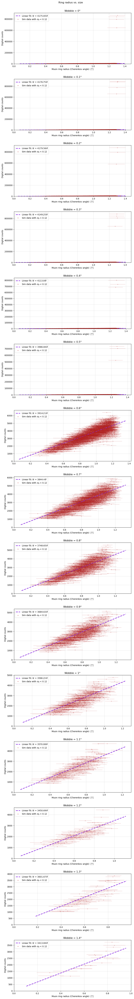

In [70]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]

    good_radii = radii[radii_err < err_cutoff]
    good_radii_err = radii_err[radii_err < err_cutoff]
    good_corr_sizes = corr_sizes[radii_err < err_cutoff]

    fit_0 = curve_fit(
    linear_0,
    xdata=good_corr_sizes[:-6], 
    ydata=good_radii[:-6],
    sigma=good_radii_err[:-6], 
    absolute_sigma=True, 
    p0=[5000],
    )

    slope_0 = fit_0[0][0]
    angles_range = np.linspace(np.min(good_radii) - 0.2, np.max(good_radii) + 0.1, 1000)
    
    plt.subplot(15, 1, i+1)
    plt.errorbar(x=good_radii, xerr=good_radii_err, y=good_corr_sizes, c='firebrick', marker='o', ms=3, ls='', alpha=0.2,
                 label=r'Sim data with $\sigma_\theta$ < {}'.format(round(err_cutoff, 2)))
    plt.plot(angles_range, slope_0 * angles_range, c='blueviolet', lw=2.5, ls='--',
             label=r'Linear fit: $N \, = \, {} \, \theta$'.format(round(slope_0, 2)))

    plt.grid(alpha=0.4)
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel('Digital counts')
    plt.legend()
    plt.title('Wobble = ' + w + '°')

    plt.xlim(xmin=0)
    plt.ylim(ymin=0)

plt.suptitle('Ring radius vs. size')
plt.show()

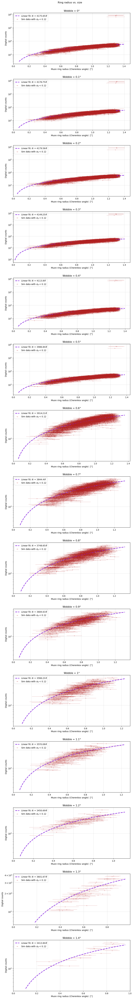

In [71]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]

    good_radii = radii[radii_err < err_cutoff]
    good_radii_err = radii_err[radii_err < err_cutoff]
    good_corr_sizes = corr_sizes[radii_err < err_cutoff]

    fit_0 = curve_fit(
    linear_0,
    xdata=good_corr_sizes[:-6], 
    ydata=good_radii[:-6],
    sigma=good_radii_err[:-6], 
    absolute_sigma=True, 
    p0=[5000],
    )

    slope_0 = fit_0[0][0]
    angles_range = np.linspace(np.min(good_radii) - 0.2, np.max(good_radii) + 0.1, 1000)
    
    plt.subplot(15, 1, i+1)
    plt.errorbar(x=good_radii, xerr=good_radii_err, y=good_corr_sizes, c='firebrick', marker='o', ms=3, ls='', alpha=0.2,
                 label=r'Sim data with $\sigma_\theta$ < {}'.format(round(err_cutoff, 2)))
    plt.plot(angles_range, slope_0 * angles_range, c='blueviolet', lw=2.5, ls='--',
             label=r'Linear fit: $N \, = \, {} \, \theta$'.format(round(slope_0, 2)))

    plt.grid(alpha=0.4)
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel('Digital counts')
    plt.legend()
    plt.title('Wobble = ' + w + '°')

    plt.xlim(xmin=0)
    plt.yscale('log')

plt.suptitle('Ring radius vs. size')
plt.show()

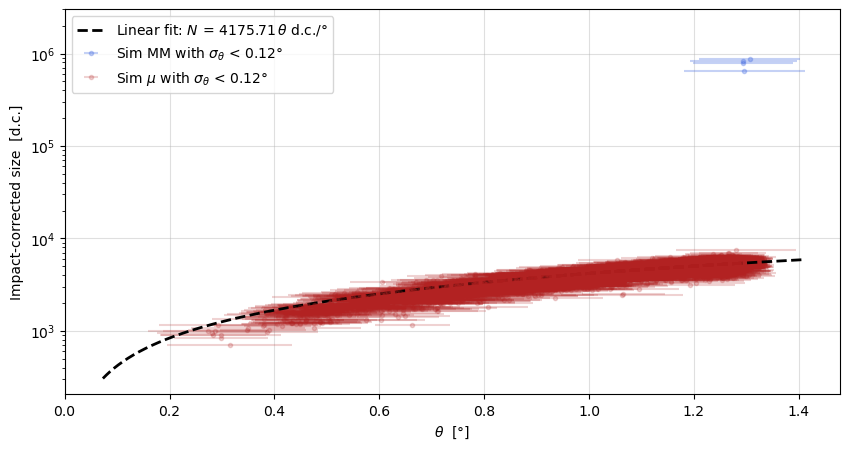

In [72]:
plt.figure(figsize=(10, 5))
#plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles[:1]):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]

    good_radii = radii[radii_err < err_cutoff]
    good_radii_err = radii_err[radii_err < err_cutoff]
    good_corr_sizes = corr_sizes[radii_err < err_cutoff]

    fit_0 = curve_fit(
    linear_0,
    xdata=good_corr_sizes[:-4], 
    ydata=good_radii[:-4],
    sigma=good_radii_err[:-4], 
    absolute_sigma=True, 
    p0=[5000],
    )

    slope_0 = fit_0[0][0]
    angles_range = np.linspace(np.min(good_radii) - 0.2, np.max(good_radii) + 0.1, 1000)
    
    #plt.subplot(15, 1, i+1)
    plt.errorbar(x=good_radii[-4:], xerr=good_radii_err[-4:], y=good_corr_sizes[-4:], c='royalblue', marker='o', ms=3, ls='', alpha=0.3,
                 label=r'Sim MM with $\sigma_\theta$ < {}°'.format(round(err_cutoff, 2)))
    plt.errorbar(x=good_radii[:-4], xerr=good_radii_err[:-4], y=good_corr_sizes[:-4], c='firebrick', marker='o', ms=3, ls='', alpha=0.2,
                 label=r'Sim $\mu$ with $\sigma_\theta$ < {}°'.format(round(err_cutoff, 2)))
    plt.plot(angles_range, slope_0 * angles_range, c='black', lw=2, ls='--',
             label=r'Linear fit: $N \, = \, {} \, \theta$ d.c./°'.format(round(slope_0, 2)))

    plt.grid(alpha=0.4)
    plt.xlabel(r'$\theta$  [°]')
    plt.ylabel('Impact-corrected size  [d.c.]')
    plt.legend()
    #plt.title('Wobble = ' + w + '°')

    plt.xlim(xmin=0)
    plt.yscale('log')
    plt.ylim(ymax=3e6)

#plt.suptitle('Ring radius vs. size')
plt.show()

In [73]:
# Chi2 test

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]

    good_radii = radii[radii_err < err_cutoff]
    good_radii_err = radii_err[radii_err < err_cutoff]
    good_corr_sizes = corr_sizes[radii_err < err_cutoff]

    fit_0 = curve_fit(
    linear_0,
    xdata=good_corr_sizes[:-6], 
    ydata=good_radii[:-6],
    sigma=good_radii_err[:-6], 
    absolute_sigma=True, 
    p0=[5000],
    )

    slope_0 = fit_0[0][0]
    model_guesses_0 = linear_0(good_corr_sizes, slope_0)

    chi2 = np.sum((model_guesses_0 - good_radii)**2 / (good_radii_err)**2)
    dof = len(model_guesses_0) - 1
    red_chi2 = chi2/dof
    print('Wobble = {}°'.format(w) + ': reduced chi^2', red_chi2)

Wobble = 0°: reduced chi^2 3613.3424595944216
Wobble = 0.1°: reduced chi^2 3462.9534144729732
Wobble = 0.2°: reduced chi^2 2331.8622530907164
Wobble = 0.3°: reduced chi^2 4193.896305120209
Wobble = 0.4°: reduced chi^2 2911.2205161563916
Wobble = 0.5°: reduced chi^2 3188.887948110002
Wobble = 0.6°: reduced chi^2 4.419025413409006
Wobble = 0.7°: reduced chi^2 3.6586968495800374
Wobble = 0.8°: reduced chi^2 3.7281891575456076
Wobble = 0.9°: reduced chi^2 3.0782106111409697
Wobble = 1°: reduced chi^2 2.634818721360671
Wobble = 1.1°: reduced chi^2 2.294940987890248
Wobble = 1.2°: reduced chi^2 2.2454840145767103
Wobble = 1.3°: reduced chi^2 2.3197557497204113
Wobble = 1.4°: reduced chi^2 2.820277453305977


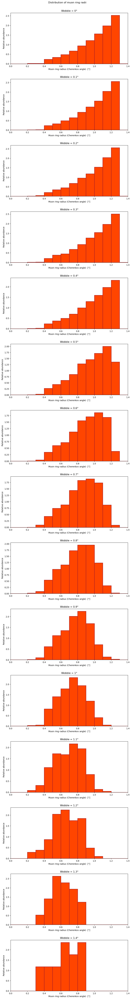

In [74]:
histobins = np.arange(0, 1.5, 0.1)

plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]

    good_radii = radii[radii_err < err_cutoff]

    plt.subplot(15, 1, i+1)
    plt.hist(good_radii, bins=histobins, density=True, edgecolor='firebrick', lw=2, color='orangered')
    plt.xlim(histobins[0], histobins[-1])
    
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel('Relative abundance')
    plt.title('Wobble = ' + w + '°')

plt.suptitle('Distribution of muon ring radii')
plt.show()

In [75]:
muon_mass = (105.65837 * u.MeV/c.c**2).to(u.kg).value  # kg
veritas_alt = 1268  # m
optimal_wvl = 380*1e-9

def n_air(lam, alt=veritas_alt):

    # Empirically determined constants
    A = 2.73e-4 
    B = 1.23e-18  # m^2
    C = 3.56e-32  # m^4
    
    # Scale height of the atmosphere
    h_0 = 8.4e3  # m

    epsilon_0 = A + B/lam**2 + C/lam**4
    epsilon = epsilon_0 * np.exp(-alt / h_0)
    
    return 1 + epsilon

def get_beta(E, m=c.m_e.value):

    return np.sqrt(1 - m**2 * c.c.value**4 / E**2)

def get_cherenkov_angle(beta, n):

    return np.arccos(1 / (beta * n))

def dNdtheta(theta, N_tot, E_min, E_max, index, n, m):

    a = N_tot * (index+1) / (E_max**(index+1) - E_min**(index+1))

    A = a * (m * c.c.value**2) ** (index+1)
    B = (1 - n**-2 * np.cos(theta)**-2) ** (-0.5*index - 1.5)
    C = np.tan(theta) * n**-2 * np.cos(theta)**-2

    return A * B * C

E_min = 5.3 * u.GeV.to(u.J)  # J
E_max = 1e4 * u.GeV.to(u.J)  # J
index = -2.7

reference_n = n_air(optimal_wvl)
asymptotic_theta = get_cherenkov_angle(beta=1, n=reference_n)
sample_thetas = np.linspace(
    get_cherenkov_angle(beta=get_beta(E_min, m=muon_mass), n=reference_n),
    get_cherenkov_angle(beta=get_beta(E_max, m=muon_mass), n=reference_n),
    10000
)

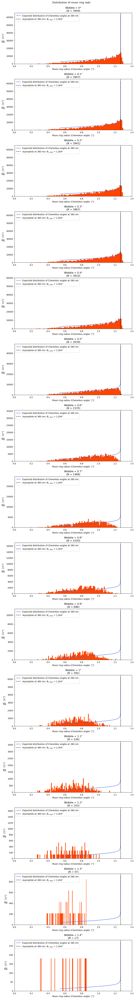

In [76]:
histobins = np.arange(0, 1.5, 0.1)

plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]

    good_radii = radii[radii_err < err_cutoff]
    N_tot = len(good_radii)

    histo_values, bin_edges = np.histogram(good_radii, bins=100, density=True)

    plt.subplot(15, 1, i+1)
    plt.stairs(histo_values * N_tot, bin_edges, fill=True, color='orangered')  # Area of all bins = N_tot
    
    plt.plot(sample_thetas / np.pi * 180, 
             dNdtheta(sample_thetas, N_tot, E_min, E_max, index, n=reference_n, m=muon_mass) 
             * np.pi / 180,
             c='royalblue', lw=1.5,
             label='Expected distribution of Cherenkov angles at {} nm'.format(int(optimal_wvl * 1e9)))
    
    plt.axvline(asymptotic_theta / np.pi * 180, 
                label='Asymptote at {} nm: '.format(int(optimal_wvl * 1e9))
                + r'$\theta_{C, \mathrm{max}}$ = ' 
                + str(round(asymptotic_theta / np.pi * 180, 3)) + '°',
                c='black', lw=1.5, ls='--')
    
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel(r'$\frac{dN}{d\theta_C}$  [1/°]')
    plt.title('Wobble = ' + w + '°\n' + r'($N$ = {})'.format(int(N_tot)))
    
    plt.xlim(histobins[0], histobins[-1])
    plt.legend()

plt.suptitle('Distribution of muon ring radii')
plt.show()

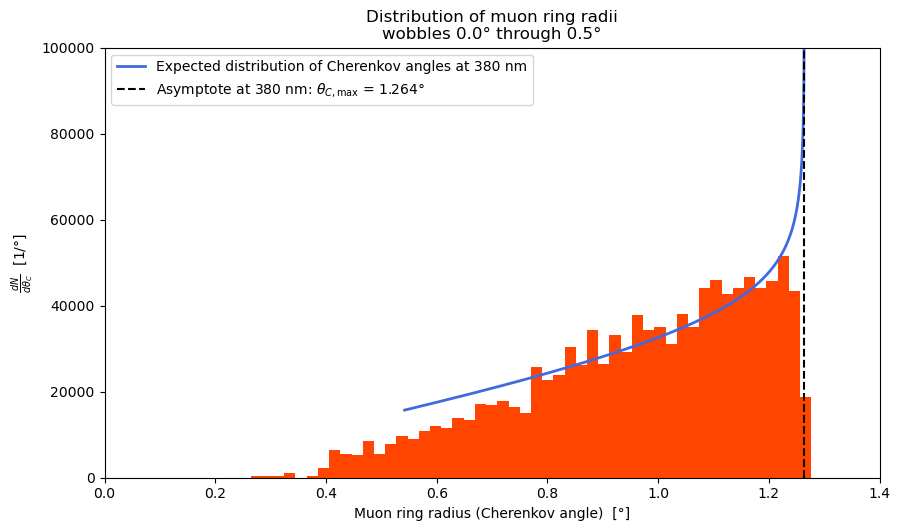

In [77]:
histobins = np.arange(0, 1.5, 0.1)

plt.figure(figsize=(10, 5))
plt.subplots_adjust(top=0.97, hspace=0.3)

all_good_radii = []

for i, w in enumerate(wobbles[:6]):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]

    good_radii = radii[radii_err < err_cutoff]
    all_good_radii += good_radii.tolist()

all_good_radii = np.array(all_good_radii)
N_tot = len(all_good_radii)

histo_values, bin_edges = np.histogram(good_radii, bins=50, density=True)

plt.stairs(histo_values * N_tot, bin_edges, fill=True, color='orangered')  # Area of all bins = N_tot

plt.plot(sample_thetas / np.pi * 180, 
         dNdtheta(sample_thetas, N_tot, E_min, E_max, index, n=reference_n, m=muon_mass) 
         * np.pi / 180,
         c='royalblue', lw=2,
         label='Expected distribution of Cherenkov angles at {} nm'.format(int(optimal_wvl * 1e9)))

plt.axvline(asymptotic_theta / np.pi * 180, 
            label='Asymptote at {} nm: '.format(int(optimal_wvl * 1e9))
            + r'$\theta_{C, \mathrm{max}}$ = ' 
            + str(round(asymptotic_theta / np.pi * 180, 3)) + '°',
            c='black', lw=1.5, ls='--')

plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
plt.ylabel(r'$\frac{dN}{d\theta_C}$  [1/°]')
plt.title('Distribution of muon ring radii\n' + 'wobbles 0.0° through {}°'.format(w))

plt.xlim(histobins[0], histobins[-1])
plt.ylim(0, 1e5)
plt.legend()

plt.show()

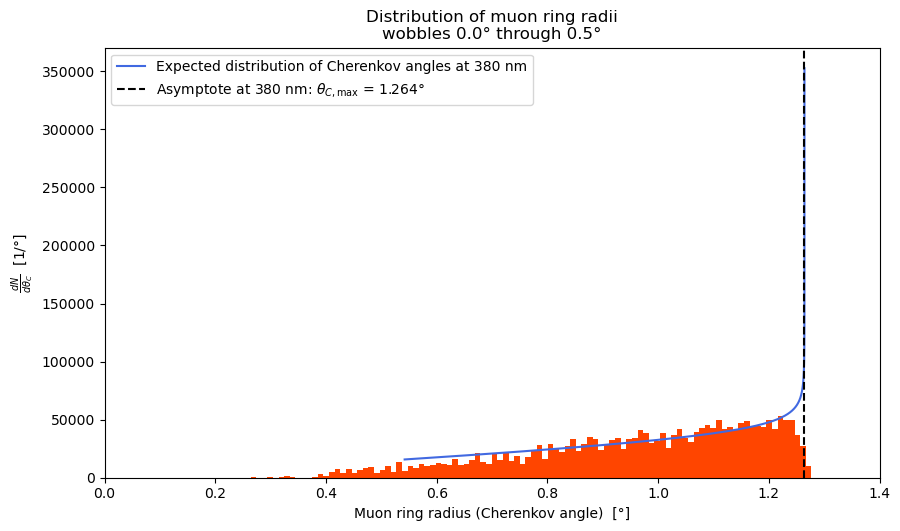

In [78]:
histobins = np.arange(0, 1.5, 0.1)

plt.figure(figsize=(10, 5))
plt.subplots_adjust(top=0.97, hspace=0.3)

all_good_radii = []

for i, w in enumerate(wobbles[:6]):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]

    good_radii = radii[radii_err < err_cutoff]
    all_good_radii += good_radii.tolist()

all_good_radii = np.array(all_good_radii)
N_tot = len(all_good_radii)

histo_values, bin_edges = np.histogram(good_radii, bins=100, density=True)

plt.stairs(histo_values * N_tot, bin_edges, fill=True, color='orangered')  # Area of all bins = N_tot

plt.plot(sample_thetas / np.pi * 180, 
         dNdtheta(sample_thetas, N_tot, E_min, E_max, index, n=reference_n, m=muon_mass) 
         * np.pi / 180,
         c='royalblue', lw=1.5,
         label='Expected distribution of Cherenkov angles at {} nm'.format(int(optimal_wvl * 1e9)))

plt.axvline(asymptotic_theta / np.pi * 180, 
            label='Asymptote at {} nm: '.format(int(optimal_wvl * 1e9))
            + r'$\theta_{C, \mathrm{max}}$ = ' 
            + str(round(asymptotic_theta / np.pi * 180, 3)) + '°',
            c='black', lw=1.5, ls='--')

plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
plt.ylabel(r'$\frac{dN}{d\theta_C}$  [1/°]')
plt.title('Distribution of muon ring radii\n' + 'wobbles 0.0° through {}°'.format(w))

plt.xlim(histobins[0], histobins[-1])
plt.legend()

plt.show()

In [79]:
def dNdxi(xi, N_tot, xi_max):
    return N_tot / xi_max**2 * (2 * xi)

xi_max = 3

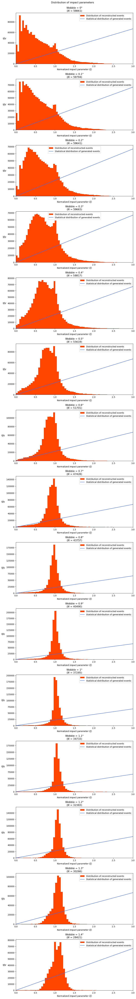

In [80]:
sample_xis = np.arange(0, 3.1, 0.1) 

plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    distances = get_distance(*sim_muon_params_per_wobble[i][:4])
    radii = sim_muon_params_per_wobble[i][4]
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    
    recalc_xis = xi_from_xi_div_factor(2 * distances / radii)
    # recalc_factors = np.zeros_like(recalc_xis)
    # for i, xi in enumerate(recalc_xis):
    #     recalc_factors[i] = get_impact_factor(xi)

    N_tot = len(recalc_xis)

    histo_values, bin_edges = np.histogram(recalc_xis, bins=60, density=True)

    plt.subplot(15, 1, i+1)
    plt.stairs(histo_values * N_tot, bin_edges, fill=True, color='orangered', 
               label='Distribution of reconstructed events')  # Area of all bins = N_tot
    
    plt.plot(sample_xis, dNdxi(sample_xis, 1e5 + 6, xi_max), c='royalblue', lw=1.5,
             label='Statistical distribution of generated events')
    
    plt.xlabel(r'Normalized impact parameter ($\xi$)')
    plt.ylabel(r'$\frac{dN}{d\xi}$')
    plt.title('Wobble = ' + w + '°\n' + r'($N$ = {})'.format(int(N_tot)))
    
    plt.xlim(sample_xis[0], sample_xis[-1])
    plt.legend()

plt.suptitle('Distribution of impact parameters')
plt.show()

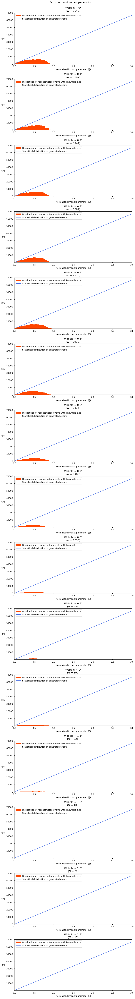

In [81]:
sample_xis = np.arange(0, 3.1, 0.1) 

plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    distances = get_distance(*sim_muon_params_per_wobble[i][:4])[validity]
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    
    recalc_xis = xi_from_xi_div_factor(2 * distances / radii)
    recalc_xis = recalc_xis[radii_err < err_cutoff]
    # recalc_factors = np.zeros_like(recalc_xis)
    # for i, xi in enumerate(recalc_xis):
    #     recalc_factors[i] = get_impact_factor(xi)

    N_tot = len(recalc_xis)

    histo_values, bin_edges = np.histogram(recalc_xis, bins=20, density=True)

    plt.subplot(15, 1, i+1)
    plt.stairs(histo_values * N_tot, bin_edges, fill=True, color='orangered', 
               label='Distribution of reconstructed events with knowable size')  # Area of all bins = N_tot

    sample_dNdxis = dNdxi(sample_xis, 1e5, xi_max)
    for j, xi in enumerate(sample_xis):
        if xi <= 7/6:
            sample_dNdxis[j] += dNdxi(xi, 5, 7/6)
    
    plt.plot(sample_xis, sample_dNdxis, c='royalblue', lw=1.5,
             label='Statistical distribution of generated events')
    
    plt.xlabel(r'Normalized impact parameter ($\xi$)')
    plt.ylabel(r'$\frac{dN}{d\xi}$')
    plt.title('Wobble = ' + w + '°\n' + r'($N$ = {})'.format(int(N_tot)))
    
    plt.xlim(sample_xis[0], sample_xis[-1])
    plt.legend()

plt.suptitle('Distribution of impact parameters')
plt.show()

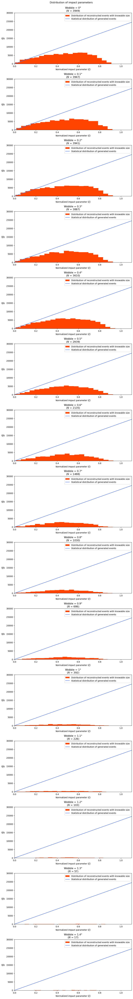

In [82]:
sample_xis = np.arange(0, 3.1, 0.1) 

plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    distances = get_distance(*sim_muon_params_per_wobble[i][:4])[validity]
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    
    recalc_xis = xi_from_xi_div_factor(2 * distances / radii)
    recalc_xis = recalc_xis[radii_err < err_cutoff]
    # recalc_factors = np.zeros_like(recalc_xis)
    # for i, xi in enumerate(recalc_xis):
    #     recalc_factors[i] = get_impact_factor(xi)

    N_tot = len(recalc_xis)

    histo_values, bin_edges = np.histogram(recalc_xis, bins=20, density=True)

    plt.subplot(15, 1, i+1)
    plt.stairs(histo_values * N_tot, bin_edges, fill=True, color='orangered', 
               label='Distribution of reconstructed events with knowable size')  # Area of all bins = N_tot
    
    sample_dNdxis = dNdxi(sample_xis, 1e5, xi_max)
    for j, xi in enumerate(sample_xis):
        if xi <= 7/6:
            sample_dNdxis[j] += dNdxi(xi, 5, 7/6)
    
    plt.plot(sample_xis, sample_dNdxis, c='royalblue', lw=1.5,
             label='Statistical distribution of generated events')
    
    plt.xlabel(r'Normalized impact parameter ($\xi$)')
    plt.ylabel(r'$\frac{dN}{d\xi}$')
    plt.title('Wobble = ' + w + '°\n' + r'($N$ = {})'.format(int(N_tot)))
    
    #plt.xlim(sample_xis[0], sample_xis[-1])
    plt.xlim(0, 1.1)
    plt.ylim(0, 30000)
    plt.legend()

plt.suptitle('Distribution of impact parameters')
plt.show()

191
196
198
165
186
121
79
37
28
16
13
7
3
2
0


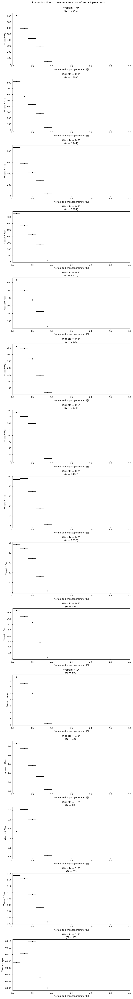

In [83]:
sample_xis = np.arange(0, 3.1, 0.1) 

plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

bin_interval = 0.2
bin_edges = np.arange(0, 1 + bin_interval, bin_interval)
mid_bins = bin_edges[:-1] + bin_interval/2

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    distances = get_distance(*sim_muon_params_per_wobble[i][:4])[validity]
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    sizes = sim_muon_params_per_wobble[i][6][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]
    
    recalc_xis = xi_from_xi_div_factor(2 * distances / radii)
    recalc_xis = recalc_xis[radii_err < err_cutoff]
    evndisp_factors = sizes / corr_sizes
    evndisp_xis = xi_from_factor(evndisp_factors)
    evndisp_xis = evndisp_xis[radii_err < err_cutoff]
    recalc_xis = xi_from_xi_div_factor(2 * distances / radii)
    recalc_xis = recalc_xis[radii_err < err_cutoff]
    # recalc_factors = np.zeros_like(recalc_xis)
    # for i, xi in enumerate(recalc_xis):
    #     recalc_factors[i] = get_impact_factor(xi)

    N_tot = len(evndisp_xis)

    histo_values, bin_edges = np.histogram(evndisp_xis, bin_edges, density=False)

    ratios = np.zeros_like(mid_bins)
    for j, xi in enumerate(mid_bins):
        dN_r = histo_values[j] * N_tot * bin_interval
        dN_g = dNdxi(xi, 1e5, xi_max) * bin_interval
        if xi <= 7/6:
            dN_g += dNdxi(xi, 5, 7/6) * bin_interval
    
        ratios[j] = dN_r / dN_g
    
    plt.subplot(15, 1, i+1)
    plt.errorbar(x=mid_bins, xerr=bin_interval/2, y=ratios, c='black', marker='o', ms=4, ls='')
    
    plt.xlabel(r'Normalized impact parameter ($\xi$)')
    plt.ylabel(r'$N_\mathrm{reconst} \div N_\mathrm{gen}$')
    plt.title('Wobble = ' + w + '°\n' + r'($N$ = {})'.format(int(N_tot)))
    
    plt.xlim(sample_xis[0], sample_xis[-1])

    # print(bin_edges, [int(number) for number in histo_values * N_tot * bin_interval])
    # for number in histo_values:
    #     print(int(number), end='\t')
    # print('')
    print(int(histo_values[4]))

plt.suptitle('Reconstruction success as a function of impact parameters')
plt.show()

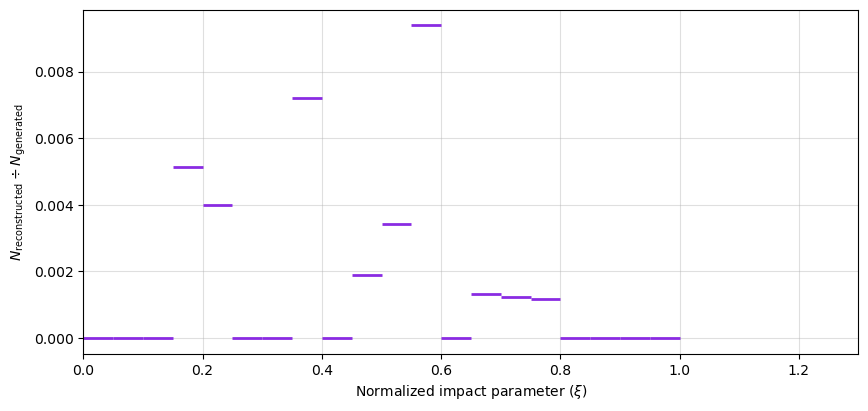

In [84]:
num_wobbles = 6

sample_xis = np.arange(0, 3.1, 0.1) 

bin_interval = 0.05
bin_edges = np.arange(0, 1 + bin_interval, bin_interval)
mid_bins = bin_edges[:-1] + bin_interval/2
ratios = np.zeros_like(mid_bins)

plt.figure(figsize=(10, 4))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles[:num_wobbles]):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    distances = get_distance(*sim_muon_params_per_wobble[i][:4])[validity]
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    
    recalc_xis = xi_from_xi_div_factor(2 * distances / radii)
    recalc_xis = recalc_xis[radii_err < err_cutoff]
    # recalc_factors = np.zeros_like(recalc_xis)
    # for i, xi in enumerate(recalc_xis):
    #     recalc_factors[i] = get_impact_factor(xi)

    # N_tot = len(recalc_xis)

    histo_values, bin_edges = np.histogram(evndisp_xis, bins=bin_edges, density=False)

    for j, xi in enumerate(mid_bins):
        dN_r = histo_values[j]
        dN_g = dNdxi(xi, 1e5, xi_max) * bin_interval
        if xi <= 7/6:
            dN_g += dNdxi(xi, 5, 7/6) * bin_interval

        ratios[j] = dN_r / dN_g
    
plt.errorbar(x=mid_bins, xerr=bin_interval/2, y=ratios, c='blueviolet', marker='', lw=2, ls='')

plt.xlabel(r'Normalized impact parameter ($\xi$)')
plt.ylabel(r'$N_\mathrm{reconstructed} \div N_\mathrm{generated}$')
# plt.title('Reconstruction success as a function of impact parameters\n' + 'wobbles 0.0° through {}°'.format(w))

plt.xlim(0, 1.3)
plt.grid(alpha=0.4)

plt.show()

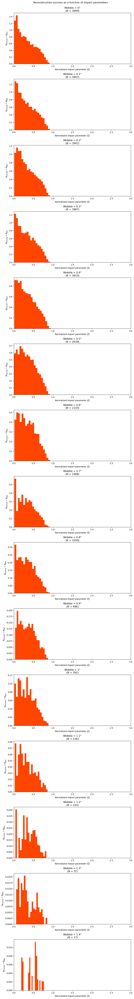

In [85]:
sample_xis = np.arange(0, 3.1, 0.1) 

plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    distances = get_distance(*sim_muon_params_per_wobble[i][:4])[validity]
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    
    recalc_xis = xi_from_xi_div_factor(2 * distances / radii)
    recalc_xis = recalc_xis[radii_err < err_cutoff]
    # recalc_factors = np.zeros_like(recalc_xis)
    # for i, xi in enumerate(recalc_xis):
    #     recalc_factors[i] = get_impact_factor(xi)

    N_tot = len(recalc_xis)

    histo_values, bin_edges = np.histogram(recalc_xis, bins=20, density=True)
    bin_interval = bin_edges[1] - bin_edges[0]
    mid_bins = bin_edges[:-1] + bin_interval/2

    ratios = np.zeros_like(mid_bins)
    for j, xi in enumerate(mid_bins):
        dN_r = histo_values[j] * N_tot * bin_interval
        dN_g = dNdxi(xi, 1e5 + 6, xi_max) * bin_interval
        ratios[j] = dN_r / dN_g
    
    plt.subplot(15, 1, i+1)
    plt.stairs(ratios, bin_edges, fill=True, color='orangered')
    
    plt.xlabel(r'Normalized impact parameter ($\xi$)')
    plt.ylabel(r'$N_\mathrm{reconst} \div N_\mathrm{gen}$')
    plt.title('Wobble = ' + w + '°\n' + r'($N$ = {})'.format(int(N_tot)))
    
    plt.xlim(sample_xis[0], sample_xis[-1])

plt.suptitle('Reconstruction success as a function of impact parameters')
plt.show()

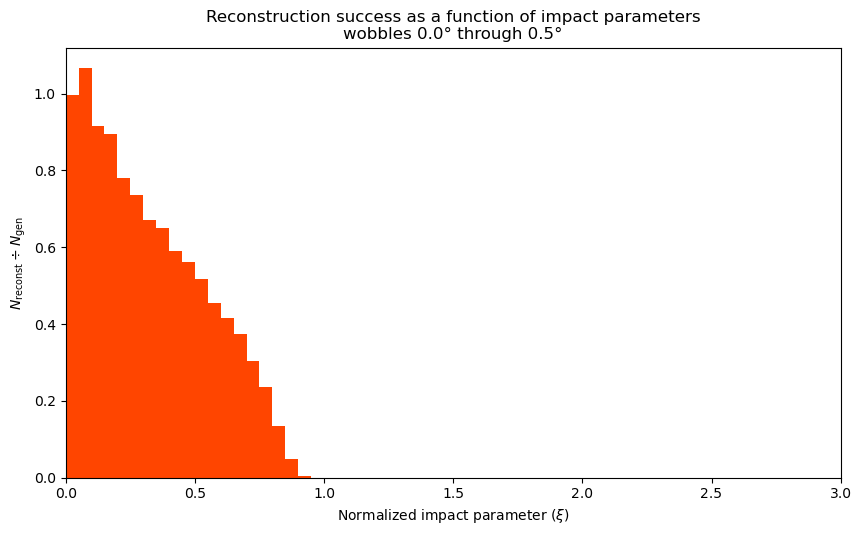

In [86]:
num_wobbles = 6

sample_xis = np.arange(0, 3.1, 0.1) 

bin_interval = 0.05
bin_edges = np.arange(0, 1 + bin_interval, bin_interval)
mid_bins = bin_edges[:-1] + bin_interval/2
ratios = np.zeros_like(mid_bins)

plt.figure(figsize=(10, 5))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles[:num_wobbles]):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    distances = get_distance(*sim_muon_params_per_wobble[i][:4])[validity]
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    
    recalc_xis = xi_from_xi_div_factor(2 * distances / radii)
    recalc_xis = recalc_xis[radii_err < err_cutoff]
    # recalc_factors = np.zeros_like(recalc_xis)
    # for i, xi in enumerate(recalc_xis):
    #     recalc_factors[i] = get_impact_factor(xi)

    # N_tot = len(recalc_xis)

    histo_values, bin_edges = np.histogram(recalc_xis, bins=bin_edges, density=False)

    for j, xi in enumerate(mid_bins):
        dN_r = histo_values[j]
        dN_g = dNdxi(xi, num_wobbles * (1e5 + 6), xi_max) * bin_interval
        ratios[j] += dN_r / dN_g
    
plt.stairs(ratios, bin_edges, fill=True, color='orangered')

plt.xlabel(r'Normalized impact parameter ($\xi$)')
plt.ylabel(r'$N_\mathrm{reconst} \div N_\mathrm{gen}$')
plt.title('Reconstruction success as a function of impact parameters\n' + 'wobbles 0.0° through {}°'.format(w))

plt.xlim(sample_xis[0], sample_xis[-1])

plt.show()

In [87]:
wobbles_float = np.array([float(w) for w in wobbles])
good_num_reconstruct = np.zeros_like(wobbles_float)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    good_radii = radii[radii_err < err_cutoff]
    
    good_num_reconstruct[i] = len(good_radii)
    print(len(radii))

4043
4047
4031
3982
3703
3030
2243
1578
1133
789
489
302
180
115
56


In [88]:
for i in good_num_reconstruct: print(int(i))

3949
3947
3941
3887
3610
2939
2135
1488
1030
686
392
226
103
57
17


In [89]:
# plt.figure(figsize=(10, 5))

# plt.scatter(wobbles_float, num_reconstruct, c='black', marker='s', s=20, label='Reconstructed muon images')
# plt.scatter(wobbles_float, num_reconstruct_valid, c='forestgreen', marker='o', s=20, label='Reconstructed muon images with knowable size')
    
# plt.xlabel('Offset angle  [°]')
# plt.ylabel('Number')
# plt.title('Number of reconstructed muon images as a function of wobble')

# plt.legend()
# plt.show()

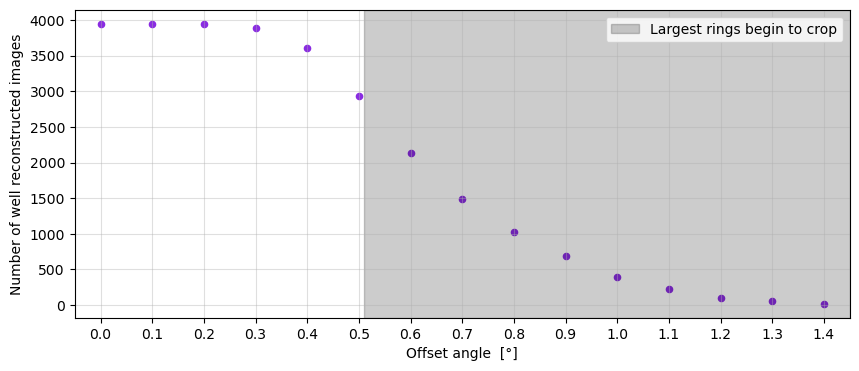

In [90]:
plt.figure(figsize=(10, 4))

# plt.subplot(2, 1, 1)
# plt.scatter(wobbles_float, num_reconstruct, c='black', marker='s', s=20)
    
# plt.xlabel('Offset angle  [°]')
# plt.ylabel('Number')
# plt.title('Reconstructed muon images')

# plt.subplot(2, 1, 2)

plt.scatter(wobbles_float, good_num_reconstruct, c='blueviolet', marker='o', s=20)
plt.axvspan(0.51, 1.45, color='black', alpha=0.2, label='Largest rings begin to crop')

plt.xticks(wobbles_float)
plt.grid(alpha=0.4)

plt.xlim(-0.05, 1.45)
plt.legend(loc='upper right')

plt.xlabel('Offset angle  [°]')
plt.ylabel('Number of well reconstructed images')
# plt.title('Number of reconstructed muon images as a function of wobble')
plt.show()

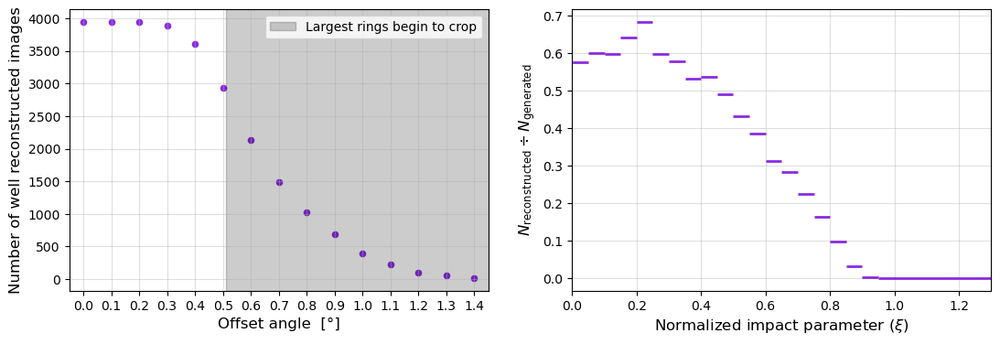

In [91]:
plt.figure(figsize=(13, 4))

# plt.subplot(2, 1, 1)
# plt.scatter(wobbles_float, num_reconstruct, c='black', marker='s', s=20)
    
# plt.xlabel('Offset angle  [°]')
# plt.ylabel('Number')
# plt.title('Reconstructed muon images')

# plt.subplot(2, 1, 2)

plt.subplot(1, 2, 1)

plt.scatter(wobbles_float, good_num_reconstruct, c='blueviolet', marker='o', s=20)
plt.axvspan(0.51, 1.45, color='black', alpha=0.2, label='Largest rings begin to crop')

plt.xticks(wobbles_float)
plt.grid(alpha=0.4)

plt.xlim(-0.05, 1.45)
plt.legend(loc='upper right')

plt.xlabel('Offset angle  [°]', fontsize=12)
plt.ylabel('Number of well reconstructed images', fontsize=12)
# plt.title('Number of reconstructed muon images as a function of wobble')

num_wobbles = 6

sample_xis = np.arange(0, 3.1, 0.1) 

bin_interval = 0.05
bin_edges = np.arange(0, 1 + bin_interval, bin_interval)
mid_bins = bin_edges[:-1] + bin_interval/2
ratios = np.zeros_like(mid_bins)


for i, w in enumerate(wobbles[:num_wobbles]):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    distances = get_distance(*sim_muon_params_per_wobble[i][:4])[validity]
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    sizes = sim_muon_params_per_wobble[i][6][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]
    
    recalc_xis = xi_from_xi_div_factor(2 * distances / radii)
    recalc_xis = recalc_xis[radii_err < err_cutoff]
    evndisp_factors = sizes / corr_sizes
    evndisp_xis = xi_from_factor(evndisp_factors)
    evndisp_xis = evndisp_xis[radii_err < err_cutoff]
    # recalc_factors = np.zeros_like(recalc_xis)
    # for i, xi in enumerate(recalc_xis):
    #     recalc_factors[i] = get_impact_factor(xi)

    # N_tot = len(recalc_xis)

    histo_values, bin_edges = np.histogram(evndisp_xis, bins=bin_edges, density=False)

    for j, xi in enumerate(mid_bins):
        dN_r = histo_values[j]
        dN_g = dNdxi(xi, 1e5, xi_max) * bin_interval
        if xi <= 7/6:
            dN_g += dNdxi(xi, 5, 7/6) * bin_interval

        ratios[j] = dN_r / dN_g

plt.subplot(1, 2, 2)

plt.errorbar(x=mid_bins, xerr=bin_interval/2, y=ratios, c='blueviolet', marker='', lw=2, ls='')
plt.plot([1.0, 2.0], [0, 0], c='blueviolet', lw=2)

plt.xlabel(r'Normalized impact parameter ($\xi$)', fontsize=12)
plt.ylabel(r'$N_\mathrm{reconstructed} \div N_\mathrm{generated}$', fontsize=12)
# plt.title('Reconstruction success as a function of impact parameters\n' + 'wobbles 0.0° through {}°'.format(w))

plt.xlim(0, 1.3)
plt.grid(alpha=0.4)

plt.show()

In [92]:
wobbles_rad = np.array([float(w) / 180 * np.pi for w in wobbles])

bin_interval = 0.05
bin_edges = np.arange(0, 1 + bin_interval, bin_interval)
mid_bins = bin_edges[:-1] + bin_interval/2

ED_efficiency = np.zeros((len(wobbles_rad), len(mid_bins)))

for i, w in enumerate(wobbles_rad):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    distances = get_distance(*sim_muon_params_per_wobble[i][:4])[validity]
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    
    recalc_xis = xi_from_xi_div_factor(2 * distances / radii)
    recalc_xis = recalc_xis[radii_err < err_cutoff]
    N_tot = len(recalc_xis)

    histo_values = np.histogram(recalc_xis, bins=bin_edges, density=True)

    for j, xi in enumerate(mid_bins):
        dN_r = histo_values[0][j] * N_tot * bin_interval
        dN_g = dNdxi(xi, 1e5, xi_max) * bin_interval
        if xi <= 7/6:
            dN_g += dNdxi(xi, 5, 7/6) * bin_interval
        ratio = dN_r / dN_g
        if ratio > 1:
            ratio = 1
        ED_efficiency[i][j] = ratio

In [93]:
get_ED_eff = RectBivariateSpline(wobbles_rad, mid_bins, ED_efficiency)

In [94]:
D = 1200  # cm
integrand = lambda w, xi: get_ED_eff(w, xi) * np.pi**2 * D**2 * xi * np.sin(w)

In [95]:
AOmega = dblquad(integrand, 0, 1, 0, 0.5 / 180 * np.pi)

In [96]:
AOmega

(88.64707625539545, 2.0531462351102007e-06)

In [97]:
run_duration = 20 + 4 * 60 #min
livetime = run_duration * 60

flux_UL = 2.44 / (AOmega[0] * livetime)
flux_UL

1.7644152860680116e-06

In [98]:
livetime * 1.1e6 * 2.4e-4

4118400.0

In [99]:
livetime = 1.4e4 * 60 * 60 * 4

flux_UL = 2.44 / (AOmega[0] * livetime)
flux_UL

1.365321352314533e-10

In [ ]:
sample_xis = np.arange(0, 3.1, 0.1) 
xispan = np.linspace(0, 1.1, 1000)

plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    distances = get_distance(*sim_muon_params_per_wobble[i][:4])[validity]
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    
    recalc_xis = xi_from_xi_div_factor(2 * distances / radii)
    recalc_xis = recalc_xis[radii_err < err_cutoff]
    # recalc_factors = np.zeros_like(recalc_xis)
    # for i, xi in enumerate(recalc_xis):
    #     recalc_factors[i] = get_impact_factor(xi)

    N_tot = len(recalc_xis)

    histo_values, bin_edges = np.histogram(recalc_xis, bins=20, density=True)
    bin_interval = bin_edges[1] - bin_edges[0]
    mid_bins = bin_edges[:-1] + bin_interval/2

    ratios = np.zeros_like(mid_bins)
    for j, xi in enumerate(mid_bins):
        dN_r = histo_values[j] * N_tot * bin_interval
        dN_g = dNdxi(xi, 1e5 + 6, xi_max) * bin_interval
        ratios[j] = dN_r / dN_g
    
    plt.subplot(15, 1, i+1)
    plt.errorbar(x=mid_bins, xerr=bin_interval/2, y=ratios, c='black', marker='o', ms=4, ls='')
    plt.plot(xispan, get_ED_eff(wobbles_rad[i], xispan)[0,:], ls=':', c='royalblue', lw=2)
    
    plt.xlabel(r'Normalized impact parameter ($\xi$)')
    plt.ylabel(r'$N_\mathrm{reconst} \div N_\mathrm{gen}$')
    plt.title('Wobble = ' + w + '°\n' + r'($N$ = {})'.format(int(N_tot)))
    
    plt.xlim(sample_xis[0], sample_xis[-1])

plt.suptitle('Reconstruction success as a function of impact parameters')
plt.show()

In [ ]:
plt.figure(figsize=(13, 4))

# plt.subplot(2, 1, 1)
# plt.scatter(wobbles_float, num_reconstruct, c='black', marker='s', s=20)
    
# plt.xlabel('Offset angle  [°]')
# plt.ylabel('Number')
# plt.title('Reconstructed muon images')

# plt.subplot(2, 1, 2)

plt.subplot(1, 2, 1)

plt.scatter(wobbles_float, good_num_reconstruct, c='blueviolet', marker='o', s=20)
plt.axvspan(0.49, 1.45, color='black', alpha=0.2, label='Largest rings begin to crop')

plt.xticks(wobbles_float)
plt.grid(alpha=0.4)

plt.xlim(-0.05, 1.45)
plt.legend(loc='upper right')

plt.xlabel('Offset angle  [°]\n\n' + r'($a$)', fontsize=12)
plt.ylabel('Number of well reconstructed images', fontsize=12)
# plt.title('Number of reconstructed muon images as a function of wobble')

num_wobbles = 6

sample_xis = np.arange(0, 3.1, 0.1) 

bin_interval = 0.05
bin_edges = np.arange(0, 1 + bin_interval, bin_interval)
mid_bins = bin_edges[:-1] + bin_interval/2
ratios = np.zeros_like(mid_bins)


for i, w in enumerate(wobbles[:num_wobbles]):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    distances = get_distance(*sim_muon_params_per_wobble[i][:4])[validity]
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    sizes = sim_muon_params_per_wobble[i][6][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]

    recalc_xis = xi_from_xi_div_factor(2 * distances / radii)
    recalc_xis = recalc_xis[radii_err < err_cutoff]
    evndisp_factors = sizes / corr_sizes
    evndisp_xis = xi_from_factor(evndisp_factors)
    evndisp_xis = evndisp_xis[radii_err < err_cutoff]
    # recalc_factors = np.zeros_like(recalc_xis)
    # for i, xi in enumerate(recalc_xis):
    #     recalc_factors[i] = get_impact_factor(xi)

    # N_tot = len(recalc_xis)

    histo_values, bin_edges = np.histogram(evndisp_xis, bins=bin_edges, density=False)

    for j, xi in enumerate(mid_bins):
        dN_r = histo_values[j]
        dN_g = dNdxi(xi, 1e5, xi_max) * bin_interval
        if xi <= 7/6:
            dN_g += dNdxi(xi, 6, 7/6) * bin_interval

        ratios[j] = dN_r / dN_g

plt.subplot(1, 2, 2)

plt.stairs(ratios, bin_edges, fill=False, edgecolor='blueviolet', lw=2)
plt.plot([1.0, 2.0], [0, 0], c='blueviolet', lw=2)

plt.xlabel(r'Normalized impact parameter ($\xi$)' + '\n\n' + r'($b$)', fontsize=12)
plt.ylabel(r'$N_\mathrm{reconstructed} \div N_\mathrm{generated}$', fontsize=12)
# plt.title('Reconstruction success as a function of impact parameters\n' + 'wobbles 0.0° through {}°'.format(w))

plt.xlim(0, 1.3)
plt.ylim(-0.03, 0.71)
plt.grid(alpha=0.4)

plt.show()